### [MicaSense RedEdge Image Processing](#MicaSense-RedEdge-Image-Processing)
### [MicaSense library](#Tutorial-2---MicaSense-library)
### [DLS Sensor Basic Usage](#Tutorial-3---DLS-Sensor-Basic-Usage)
### [ImageSet Extended](#ImageSet-Extended-Examples)
### [Image Alignment](#Image-Alignment)


# MicaSense RedEdge Image Processing

## Overview

This tutorial assumes you have gone through the basic setup [here](./MicaSense Image Processing Setup.html) and your system is set up and ready to go.

In this tutorial, we will walk through how to convert RedEdge data from raw images to radiace and then to reflectance. We will cover the tools required to do this, and walk through some of the basic image processing and radiometric conversions. 

### Opening an image with pyplot

RedEdge 16-bit images can be read with pyplot directly into numpy arrays using the pyplot `imread` function or the matplotlib `imread` function, and then we can display the image inline using the `imshow` function of `matplotlib`.

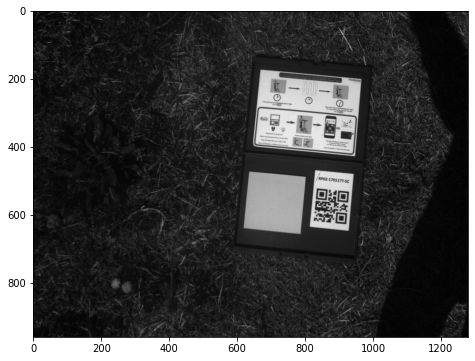

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os,glob
import math
%matplotlib inline

imagePath = os.path.join('.','data','DataRedEdge','0001SET','000')
imageName = os.path.join(imagePath,'IMG_0001_3.tif')

# Read raw image DN values
# reads 16 bit tif - this will likely not work for 12 bit images
imageRaw=plt.imread(imageName)

# Display the image
fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(imageRaw, cmap='gray')
plt.show()

### MicaSense Utilities Module

For many of the steps in the tutorial, we will use code from the MicaSense utilities module.  The code is in the micasense directory and can be imported via normal python import commands using the syntax `import micasense` or `import micasense.submodule as short_name` for use in this and other scripts. While we will not cover all of the utility functions in this tutorial, they are available for reference and some will be used and discussed in future tutorials.

### Adding a colorbar

We will use start by using a plotting function in `micasense.plotutils` that adds a colorbar to the display, so that we can more easily see changes in the values in the images and also see the range of the image values after various conversions.  This function also colorizes the grayscale images, so that changes can more easily be seen.  Depending on your viewing style, you may prefer a different color map and you can also select that colormap here or browsing the colormaps on the [matplotlib site](https://matplotlib.org/users/colormaps.html). 

<Figure size 432x288 with 0 Axes>

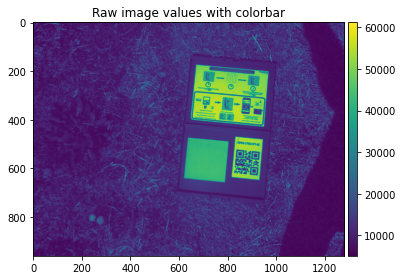

In [2]:
import micasense.plotutils as plotutils

# Optional: pick a color map that fits your viewing style
# one of 'gray, viridis, plasma, inferno, magma, nipy_spectral'
plotutils.colormap('viridis'); 

fig = plotutils.plotwithcolorbar(imageRaw, title='Raw image values with colorbar')

### Reading RedEdge Metadata

In order to perform various processing on the images, we need to read the metadata of each image.  For this we use ExifTool. We can read standard image capture metadata such as location, UTC time, imager exposure and gain, but also RedEdge specific metadata which can make processing workflows easier.  

For example, each image contains a  unique capture identifier.  Capture identifiers are shared between all 5 images captured by RedEdge at the same moment, and can be used to unambiguously group images in post processing, regardless of how the images are named or stored on disk.  Each image also contains a flight identifer which is the same for all images taken during a single power cycle of the camera.  This can be used in post-processing workflows to group images and in many cases, more easily identify when the vehicle took off and landed.

In [3]:
import micasense.metadata as metadata
exiftoolPath = None
if os.name == 'nt':
    exiftoolPath = 'C:/exiftool/exiftool.exe'
# get image metadata
meta = metadata.Metadata(imageName, exiftoolPath=exiftoolPath)
cameraMake = meta.get_item('EXIF:Make')
cameraModel = meta.get_item('EXIF:Model')
firmwareVersion = meta.get_item('EXIF:Software')
bandName = meta.get_item('XMP:BandName')
print('{0} {1} firmware version: {2}'.format(cameraMake, 
                                             cameraModel, 
                                             firmwareVersion))
print('Exposure Time: {0} seconds'.format(meta.get_item('EXIF:ExposureTime')))
print('Imager Gain: {0}'.format(meta.get_item('EXIF:ISOSpeed')/100.0))
print('Size: {0}x{1} pixels'.format(meta.get_item('EXIF:ImageWidth'),meta.get_item('EXIF:ImageHeight')))
print('Band Name: {0}'.format(bandName))
print('Center Wavelength: {0} nm'.format(meta.get_item('XMP:CentralWavelength')))
print('Bandwidth: {0} nm'.format(meta.get_item('XMP:WavelengthFWHM')))
print('Capture ID: {0}'.format(meta.get_item('XMP:CaptureId')))
print('Flight ID: {0}'.format(meta.get_item('XMP:FlightId')))
print('Focal Length: {0}'.format(meta.get_item('XMP:FocalLength')))

MicaSense RedEdge firmware version: v5.1.13
Exposure Time: 0.0007425 seconds
Imager Gain: 1.0
Size: 1280x960 pixels
Band Name: Red
Center Wavelength: 668 nm
Bandwidth: 10 nm
Capture ID: QGe61RXee60MrfdgPnZ9
Flight ID: NmiIXFYdoXaKwxR4lJYM
Focal Length: None


### Converting raw images to Radiance

Ultimately most RedEdge users want to calibrate raw images from the camera into reflectance maps.  This can be done using off-the-shelf software from third parties, but you are here because there is no fun in that!  Along with this tutorial we have included some helper utilities that will handle much of this conversion for you, but here we will walk through a few of those functions to discuss what is happening inside.

Any RedEdge workflow must include these common steps.
1. Un-bias images by accounting for the dark pixel offset
1. Compensate for imager-level effects
1. Compensate for optical chain effects
1. Normalize images by exposure and gain settings
1. Convert to a common unit system (radiance)

All of these are handled by the `micasense.utils.raw_image_to_radiance(metadata, raw_image)` function.  Let us take a look at that fuction in more detail.

First, we get the darkPixel values. These values come from optically-covered pixels on the imager which are exposed at the same time as the image pixels. They measure the small amount of random charge generation in each pixel, independent of incoming light, which is common to all semiconductor imaging devices.
```python
    blackLevel = np.array(meta.get_item('Exif.BlackLevel'))
    darkLevel = blackLevel.mean()
```
Now, we get the imager-specific calibrations.
```python
    a1, a2, a3 = meta.get_item('XMP:RadiometricCalibration')
```
We get the parameters of the optical chain (vignette) effects and create a vignette map. This map will be multiplied by the black-level corrected image values to reverse the darkening seen at the image corners.  See the `vignette_map` function for the details of the vignette parameters and their use.
```python
    V, x, y = vignette_map(meta, xDim, yDim)
```
Now we can calculate the imager-specfic radiometric correction function, which help to account for the radiometric inaccuracies of the CMOS imager pixels.
```python
    # row gradient correction
    R = 1.0 / (1.0 + a2 * y / exposureTime - a3 * y)
```
Finally, we apply these functions to the raw image to result in a corrected image
```python
    # subtract the dark level and adjust for vignette and row gradient
    L = V * R * (imageRaw - darkLevel)
```
Next, we get the exposure and gain settings (gain is represented in the photographic parameter ISO, with a base ISO of 100, so we divide the result to get a numeric gain).
```python
    exposureTime = float(meta.get_item('EXIF:ExposureTime'))
    gain = float(meta.get_item('EXIF:ISOSpeed'))/100.0 
```
Now that we have a corrected image, we can apply a conversion from calibrated digital number values to radiance units (W/m^2/nm/sr). Note that in this conversion, we need to normalize by the image bitdepth (2^16 for 16 bit images, 2^12 for 12-bit images), because the calibration coefficients are scaled to work with normalized input values.
```python
    # apply the radiometric calibration - 
    # scale by the gain-exposure product and multiply with the radiometric calibration coefficient
    bitsPerPixel = meta.get_item('EXIF:BitsPerSample')
    dnMax = float(2**bitsPerPixel)
    radianceImage = L.astype(float)/(gain * exposureTime)*a1/dnMax
 ```
 
For convenience, we have written the `raw_image_to_radiance` function to return the intermediate compensation images as well, so we can visualize them for the tutorial. These intermediate results are not required in most implementations and can be ommitted, if performance is a concern.

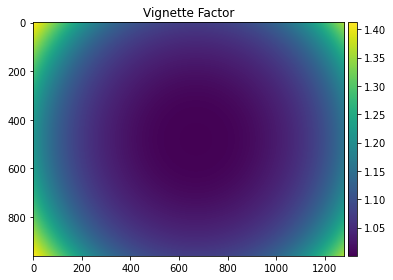

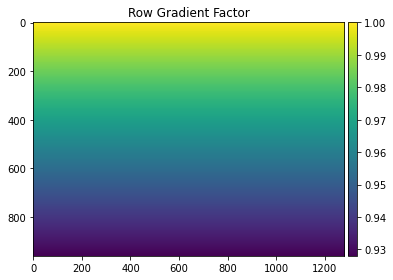

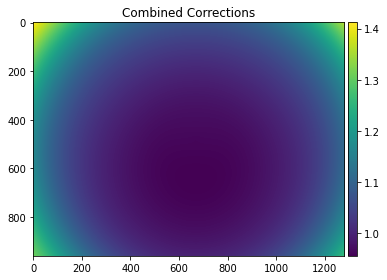

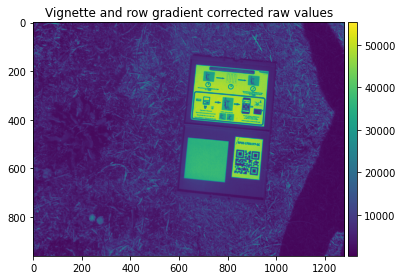

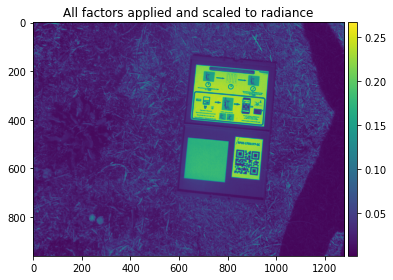

In [4]:
import micasense.utils as msutils
radianceImage, L, V, R = msutils.raw_image_to_radiance(meta, imageRaw)
plotutils.plotwithcolorbar(V,'Vignette Factor');
plotutils.plotwithcolorbar(R,'Row Gradient Factor');
plotutils.plotwithcolorbar(V*R,'Combined Corrections');
plotutils.plotwithcolorbar(L,'Vignette and row gradient corrected raw values');
plotutils.plotwithcolorbar(radianceImage,'All factors applied and scaled to radiance');

### Convert radiance to reflectance

Now that we have a flat and calibrated radiance image, we can convert into reflectance.  To do this, we will use the radiance values of the panel image of known reflectance to determine a scale factor between radiance and reflectance.

In this case, we have our MicaSense calibrated reflectance panel and it's known reflectance of 62% in the band of interest.  We will extract the area of the image containing the lambertian panel, determine it's radiance to reflectance scale factor, and then scale the whole image by that factor to get a reflectance image.

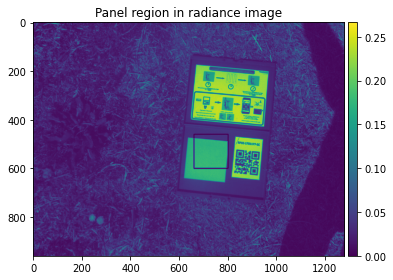

Mean Radiance in panel region: 0.151 W/m^2/nm/sr
Radiance to reflectance conversion factor: 4.050


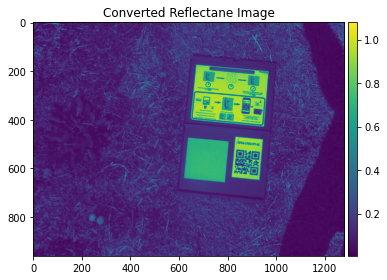

In [5]:
markedImg = radianceImage.copy()
ulx = 660 # upper left column (x coordinate) of panel area
uly = 460 # upper left row (y coordinate) of panel area
lrx = 800 # lower right column (x coordinate) of panel area
lry = 600 # lower right row (y coordinate) of panel area
cv2.rectangle(markedImg,(ulx,uly),(lrx,lry),(0,255,0),3)

# Our panel calibration by band (from MicaSense for our specific panel)
panelCalibration = { 
    "Blue": 0.60, 
    "Green": 0.61, 
    "Red": 0.61, 
    "Red edge": 0.60, 
    "NIR": 0.55 
}

# Select panel region from radiance image
panelRegion = radianceImage[uly:lry, ulx:lrx]
plotutils.plotwithcolorbar(markedImg, 'Panel region in radiance image')
meanRadiance = panelRegion.mean()
print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(meanRadiance))
panelReflectance = panelCalibration[bandName]
radianceToReflectance = panelReflectance / meanRadiance
print('Radiance to reflectance conversion factor: {:1.3f}'.format(radianceToReflectance))

reflectanceImage = radianceImage * radianceToReflectance
plotutils.plotwithcolorbar(reflectanceImage, 'Converted Reflectane Image');

In some cases we might notice that some parts of a converted reflectance image show reflectances above 1.0, or 100%, and wonder how this is possible.  In fact, reflectances higher than 100% are normal in specific cases of [specular reflections](https://en.wikipedia.org/wiki/Specular_reflection). The panel area is a special material that reflects incident light equally well in all directions; however, some of the objects in a scene (especially man-made objects) instead reflect most incident light in one direction, more like a mirror.  An example is the reflection of the sun off of the smooth surface of a car or the reflection off of a body of water.


Now we will extract the same region and verify the reflectance in that region is what we expect. In the process, we will blur and visualize the extracted area to look for any trends.  The area should have a very consistent reflectance. If a gradient or a high standard deviation (>3% absolute reflectance) is noticed across the panel area it is possible that the panel was captured under inconsistent lighting conditions (e.g. next to a wall or vehicle) or it was captured too close to the edge of the image where the optical calibration is the least accurate.

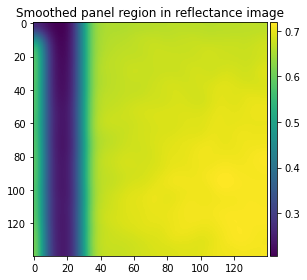

Min Reflectance in panel region: 0.12
Max Reflectance in panel region: 1.51
Mean Reflectance in panel region: 0.61
Standard deviation in region: 0.1799


In [9]:
panelRegionRaw = imageRaw[uly:lry, ulx:lrx]
panelRegionRefl = reflectanceImage[uly:lry, ulx:lrx]
panelRegionReflBlur = cv2.GaussianBlur(panelRegionRefl,(55,55),5)
plotutils.plotwithcolorbar(panelRegionReflBlur, 'Smoothed panel region in reflectance image')
print('Min Reflectance in panel region: {:1.2f}'.format(panelRegionRefl.min()))
print('Max Reflectance in panel region: {:1.2f}'.format(panelRegionRefl.max()))
print('Mean Reflectance in panel region: {:1.2f}'.format(panelRegionRefl.mean()))
print('Standard deviation in region: {:1.4f}'.format(panelRegionRefl.std()))

In this case the panel is less uniform than we would like, but we can also notice that the full color scale is only 4% of absolute reflectance.  Likewise, it's well below the standard deviation threshold we have set of 3% absolute reflectance. This panel has seen over two years of hard field use, so it may be time for it to retire.  

Reasons for a high standard deviation across a panel can include panel contamination or inconsistent lighting across the panel due to environmental conditions.  Based on the context of the image, it is also clear that the user is taking the panel image facing the sun, which can cast reflected light from the operator's clothing on the panel and contaminate results. For this reason it is always best to capture panel images in an open area and with the operator's back to the sun. 

### Undistorting images

Finally, we need to remove lens distortion effects from images for some processing workflows, such as band-to-band image alignment.  Generally for photogrammetry processes on raw (or radiance/reflectance) images, this step is not required, as the photogrammetry process will optimize a lens distortion model as part of it's bulk bundle adjustment.  RedEdge has very low distortion lenses, so the changes to images in this step tend to be very small and noticeable only in pixels on the border of the image.

# In Practice

Now that we can convert from raw RedEge images to reflectance, we will use these methods to convert an image taken during the same campaign to a reflectance image, and look at a few interesting areas of the image to validate our conversion.

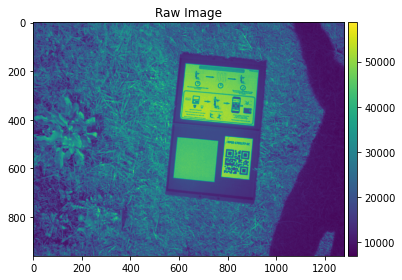

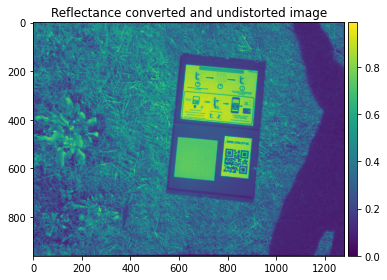

In [6]:
flightImageName = os.path.join(imagePath,'IMG_0001_4.tif')
flightImageRaw=plt.imread(flightImageName)
plotutils.plotwithcolorbar(flightImageRaw, 'Raw Image')

flightRadianceImage, _, _, _ = msutils.raw_image_to_radiance(meta, flightImageRaw)
flightReflectanceImage = flightRadianceImage * radianceToReflectance
flightUndistortedReflectance = msutils.correct_lens_distortion(meta, flightReflectanceImage)
plotutils.plotwithcolorbar(flightUndistortedReflectance, 'Reflectance converted and undistorted image');

## --------------------------------------------------------------------------------------------------------------------------------

# Tutorial 2 - MicaSense library

This tutorial assumes you have gone through the [basic setup](./Micasense Image Processing Setup.html) and builds on the basic radiance, irradiance, and reflectance concepts and code covered in the [first tutorial](./MicaSense Image Processing Tutorial 1.html). 

In this tutorial, we will cover usage of the MicaSense python library to access images and groups of images.  Most of the processing details are hidden away in the library, but the library code is open and available in the git repository. 

# Library Components

In the first tutorial, we introduced `micasense.utils` which provided some helper functions for single image manipulation, and `micasense.plotutils` which provided some plotting helpers.

For this second tutorial, we are going to introduce the usage of the included micasense libraries for opening, converting, and displaying images. This will allow us to discuss and visualize results at a high level, while the underlying source code is available for those interested in the implementation details.  In some cases, the libraries themselves may be enough to implement a custom workflow without the need to re-implement or translate the code to another system or language.

The library code provides some basic classes to manage image data.  At the highest level is the `ImageSet`, which is able to load a list of files or recursively search a whole directory into data structures which are easy to access and manipulate.  `ImageSet`s are made up of `Capture`s, which hold the set of (usually 5) images as they are simultaneously gathered by the RedEdge camera.  Within `Capture`s are `Image`s, which hold a single image file and allow easy access to the image metadata.  The `Image` class also provides the ability to extract metadata from individual images and to convert individual images in similar ways to those described in the first tutorial. 

For the rest of this article, we will look at each of the objects available starting with the single `Image` object, and work our way up to the whole `ImageSet`.  Each section in this article is standalone, and can be copied into another workbook or edited in place to explore more of the functions associated with that object.

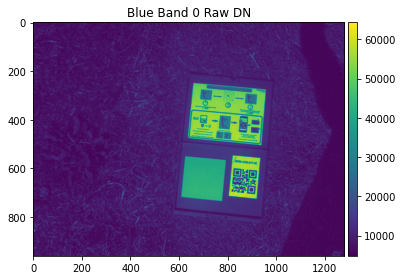

In [7]:
import os
import micasense.image as image
%matplotlib inline

imagePath = os.path.join('.','data','DataRedEdge','0001SET','000')
imageName = os.path.join(imagePath,'IMG_0001_1.tif')

img = image.Image(imageName)
img.plot_raw();

## micasense.Capture

The `Capture` class is a container for `Image`s which allows access to metadata common to the group of images. The internal `Image` objects are accessible via the `capture.images` properties, and images in this list are kept sorted by the `band` property.  Data which is different for each image can be accessed through composite methods, such as the `capture.dls_irradiance()` method, which returns a list of irradiances in band order.

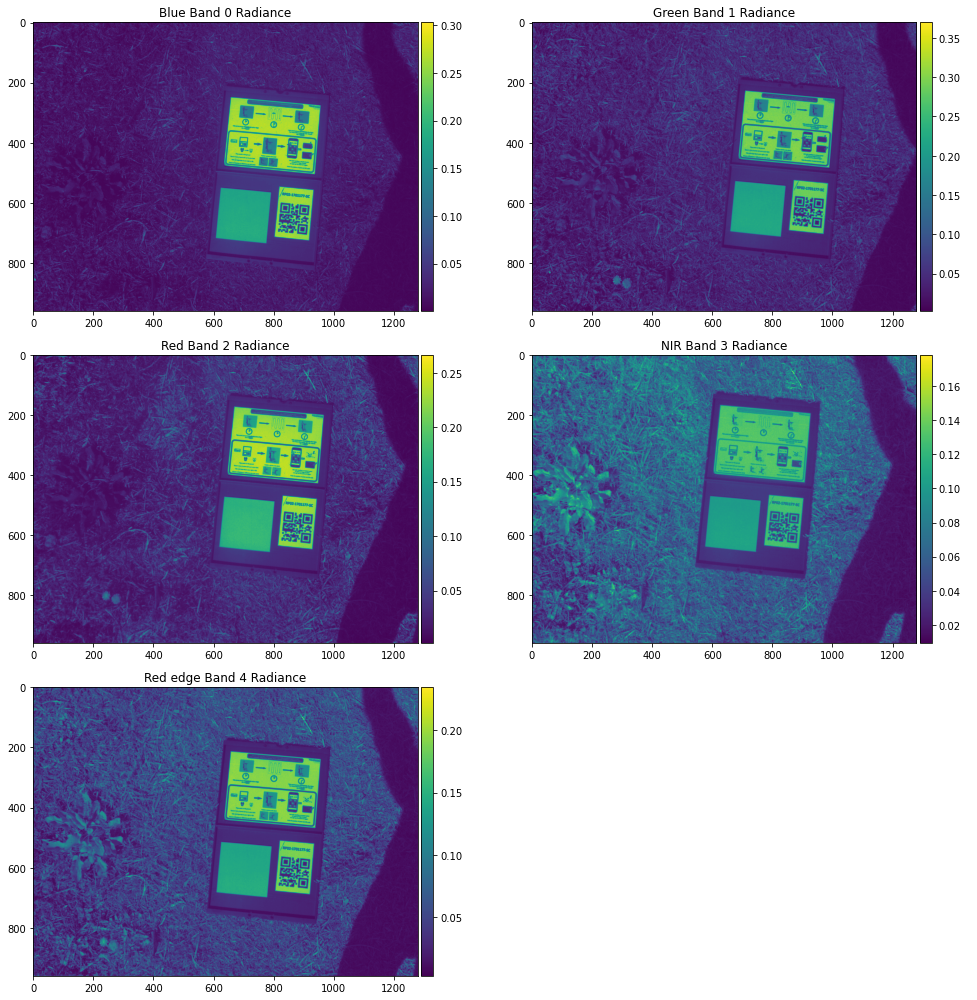

In [9]:
import os, glob
import micasense.capture as capture

images_path = os.path.join('.','data','DataRedEdge','0001SET','000')
image_names = glob.glob(os.path.join(images_path,'IMG_0001_*.tif'))
cap = capture.Capture.from_filelist(image_names)
cap.plot_radiance();

### Acessing `Capture` metadata

Metadata which is common to all captures can be accessed via methods on the `Capture` object.  Metadata which varies between the images of the capture, such as DLS information, is available as lists accessed from the capture object. 

<div class="alert alert-info">
  <strong>Note:</strong> The lists returned from metadata access on the `Capture` object are returned in `band_index` order.  All images within a capture are sorted by the image `band_index`, and all lists adhere to this ordering.  This ordering is consistent with the number at the end of each filename of a RedEdge image.
</div>

Below we plot the raw and tilt compensated DLS irradiance by center wavelength and by band name.

['Blue', 'Green', 'Red', 'NIR', 'Red edge']


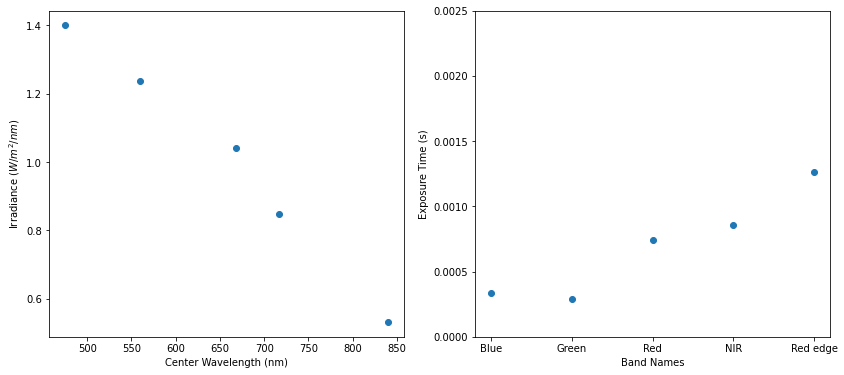

In [11]:
import matplotlib.pyplot as plt

print(cap.band_names())
fig = plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.scatter(cap.center_wavelengths(), cap.dls_irradiance())
plt.ylabel('Irradiance $(W/m^2/nm)$')
plt.xlabel('Center Wavelength (nm)')
plt.subplot(1,2,2)
plt.scatter(cap.band_names(), [img.meta.exposure() for img in cap.images])
plt.xlabel('Band Names')
plt.ylim([0,2.5e-3])
plt.ylabel('Exposure Time (s)')
plt.show()

## micasense.Panel

The `Panel` class is a helper class which can automatically extract panel information from MicaSense calibrated reflectance panels by finding the QR code within an image and using the QR Code location and orientation information to find the lambertian panel area.  The class then allows extraction of statistics from the panel area such as mean raw values, mean radiance, standard deviation, and the number of saturated pixels in the panel region. The panel object can be included standalone, or used within the context of a `Capture` object.

<div class="alert alert-info">
  <strong>Note:</strong> For the automatic panel QR code finding functions of the library to work, zbar and it's python bindings must be installed. We have made every effort to ensure this fails gracefully if zbar isn't available. Unfortunately zbar is only available using Python 2.7, not Python 3.  If you're using Python 3.x, the code available in '/micasense/panel.py' shows how to find QR codes in images and to find the panel area from the QR location.  We're currently looking for Python QR code finding options that work across platforms and Python versions, let us know if you have one that supports location!
</div>

Panel found: True
Panel serial: RP02-1701177-SC
QR Code Corners:
[[812 692]
 [906 702]
 [915 608]
 [821 598]]
Panel mean raw pixel value: 32919.32878292636
Panel raw pixel standard deviation: 14355.947489647302
Panel region pixel count: 26005
Panel region saturated pixel count: 26005


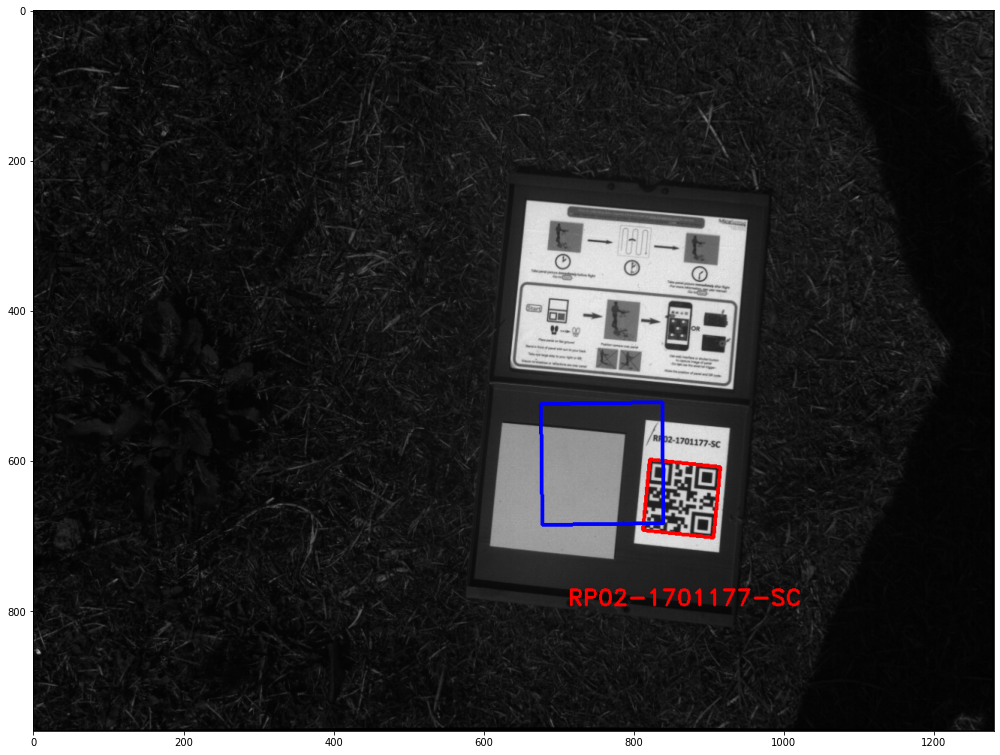

In [12]:
import os, glob
import micasense.image as image
import micasense.panel as panel

img = image.Image(imageName)
# panelCorners - if we dont have zbar installed to scan the QR codes, detect panel manually and 
panelCorners = [[[839,683],[678,685],[676,524],[838,522]],
                [[772,623],[613,625],[610,464],[770,462]],
                [[771,651],[611,653],[610,492],[770,490]],
                [[829,658],[668,659],[668,496],[829,496]],
                [[807,632],[648,634],[645,473],[805,471]]]

pnl = panel.Panel(img,panelCorners = panelCorners[0])
print("Panel found: {}".format(pnl.panel_detected()))
print("Panel serial: {}".format(pnl.serial))
print("QR Code Corners:\n{}".format(pnl.qr_corners()))
mean, std, count, saturated_count = pnl.raw()
print("Panel mean raw pixel value: {}".format(mean))
print("Panel raw pixel standard deviation: {}".format(std))
print("Panel region pixel count: {}".format(count))
print("Panel region saturated pixel count: {}".format(count))

pnl.plot();

## micasense.ImageSet

An `ImageSet` contains a group of `Capture`s. The captures can be loaded from image object, from a list of files, or by recursively searching a directory for images.

Loading an `ImageSet` can be a time consuming process.  It uses python multithreading under the hood to maximize cpu usage on multi-core machines.

In [1]:
from ipywidgets import FloatProgress
from IPython.display import display
f = FloatProgress(min=0, max=1)
display(f)
def update_f(val):
    f.value=val

import micasense.imageset as imageset
import os

images_dir = os.path.join('.','data','DataRedEdge','0008SET')

imgset = imageset.ImageSet.from_directory(images_dir, progress_callback=update_f)

for cap in imgset.captures:
    print ("Opened Capture {} with bands {}".format(cap.uuid,[str(band) for band in cap.band_names()]))

FloatProgress(value=0.0, max=1.0)

Opened Capture 7OCjvHhHBQwh1Am3VAVZ with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture 1RrKNLH2XnHEV663uC3d with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture wLT4ZvSNJ5ldywdSgfZ6 with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture 8OoxKsBRLFrVeRdF2fQh with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture B2SwDb71sWVC7Qrehyed with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture M3cU1TDjZe3axnZM06qU with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture 4aHJ525Hj3ELVJ3klCRv with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture K1mnK8NPOj00iX1vXhUa with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture lB5YKsRmvLNWb5qU028Z with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture RW4wKQ9TMla37eV39T1M with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']
Opened Capture LefduqXdkzgR9QK2KbXi with bands ['Blue', 'Green', 'Red', 'NIR', 'Red edge']

## --------------------------------------------------------------------------------------------------------------------------------

# Tutorial 3 - DLS Sensor Basic Usage

This tutorial will walk through how to convert RedEdge data from raw images to radiace and then use the DLS information in the image metadata to convert that to reflectance.

## Update for DLS2

This tutorial was originally written as a guide to basic processing of DLS1 data for RedEdge-3 and RedeEdge-M.  Since October 2018, Altum and RedEdge-MX have been shipped standard with DLS2.  DLS1 is a small, red square with a single diffuser on top.  DLS2 is a larger, thinner black rectangle with two small diffusers on top and 8 small diffusers on different up-looking faces.

For DLS2 data, we recommend using the `Capture` class to access the `Capture.dls_irradiance()` method. This will provide a compensated horizontal irradiance useful for radiometrically correcting imagery. We leave the below intact for legacy users and as a tutorial on remote sensing calibrations and terms.  

For RedEdge and Altum with up-to-date firmware, the `EXIF:HorizontalIrradiance` tag and the appropriate scale factor will provide the necessary information for reflectance compensation. If necessary, this can be further field-calibrated by using a pane image to tie the DLS2 and camera calibrations together in-situ.

# Remote Sensing Theory

In [Tutorial 1](./MicaSense%20Image%20Processing%20Tutorial%201.html) we covered conversion of the image radiance to reflecance using the average radiance from an area of a specially made lambertian reflectance panel.  As we did not get very far into remote sensing theory, we will cover that some here as we move on to the more complex problem of using the data from the RedEdge Downwelling Light Sensor (DLS).  To get started, we will review some of the fundamental measurements in remote sensing.

## Definition of Terms


The DLS measures the energy coming from the sky, while the camera measures the energy coming from the fields below.  The property that we are generally looking to estimate in agricultural remote sensing is the surface reflectance of the plants and ground below the sensor. 

The MicaSense RedEdge measures spectral radiance, a measure of the power incident on the CMOS image sensor at each pixel, and has units power per unit area per unit bandwidth per unit solid angle (W/m^2/nm/sr). We will call the radiance image L.

The MicaSense Downwelling Light Sensor (DLS) measures incoming spectral irradiance on the top surface of the device for the same 5 spectral bands as the camera. Irradiance has the units of power per unit area per unit bandwidth, or Watts per meter squared per nanometer (W/m^2/nm). We will call this downwelling quantity I.

If we look closely at the units, they differ by the last term - the unit over solid angle. This is because each pixel of the camera sensor only sees a specific solid angle, while the dls detector has a specific area.  


## Understanding the measurements

In order to use downwelling irradiance and upwelling radiance to determine reflectance, we simply need to divide pi times the irradiance by the radiance.  Our units cancel out, and we are left with the unitless quantity of reflectance.  However, there is one caveat.  In most systems, the DLS is not held level to the ground at all times, so the amount of light that shines on it's surface changes as the aircraft moves about.  In oder for that simple math to work, it's necessary that the irradiance and radiance be compensated for a very important property: the illumination angle.  

Both the radiance and irradiance are sensitive to changes in the direction of the lighting. Both quantites decrease with the cosine of the angle from the surface normal, eventually reaching zero when the light source is parallel to the surface. So when measuring irradiance, this effect needs to be corrected in order to estimate the actual irradiance.

## Different types of irradiance

To complicate matters further, the light reaching the DLS and the ground is not coming from a single source, even under sunny conditions.  The direct sunlight provides what we will call the direct source, resulting in a direct irradiance `I_direct`.  The rest of the (usually blue) sky provides what we term the indirect, or diffuse, irradiance which we will call `I_diffuse`.  Under even the sunniest conditions with the summer sun directly overhead, only about 85% of the light is direct, while the other 15% is diffuse, which we will express as the ratio 6:1.  Under thin cloud conditions, this ratio drops to close 1:1, meaning half of the measured irradiance is coming from parts of the sky other than the direction of the sun. The ratio goes even lower under fully cloudy skies, becoming fully diffuse.

As we ultimately want to estimate the time-varying irradiance, we will need to estimate both the direct and diffuse irradiance terms as well as correct for the cosine effect of the DLS sensor itself.

## Sensor-specific challenges

There's one final piece of theory required that pertains to irradiance sensing, and that is the Fresnel Effect.  The Fresnel Effect describes a physical property of the diffuser that gathers light on top of the DLS.  This effect results from the fact that much of the light striking the diffuser is reflected, and the amount reflected changes with the angle of the incident light.  So, instead of our diffuser behaving as a perfect cosine detector, we need to also compensate for the material imperfections.

## DLS pose estimation

An onboard orientation sensor provides a fairly rough version of the earth-fixed orientation of the DLS.  The quality of this orientation varies based on the quality of the sensor installation and calibration, but in even the best cases it has a few degrees of error. If the DLS and the camera are mounted fixed to one another, the photogrammetric workflow can be used to augment the orientation of the irradiance sensor.  Our examples here will use the sensor measurements directly, but significant improvements can be made using the very precise angles photorammetry can provide.

## Radiometric calibration options

As we've discussed in the first tutorial, the method of using a calibrated reflectance panel is the scientific standard for remote sensing measurements. Spectroradiometers which cost tens of thousands of dollars are calibrated in this method in the field.  Panels images may also be used both before and after each flight to track slowly changing solar irradiance. In many cases of direct sunlight with no clouds, panel images can provide the best results when taken before and after each flight. As the diffuse lighting increases, the utility of the DLS increases as well.

In cases of more varied irradiance, the DLS can be used for irradiance estimation, using only the internal pose estimation.  The DLS irradiance can be be used in conjunction with panels to ensure that the DLS and panel measurements match at the time of panel capture.  In order for this to be effective, it's important that the DLS and panel are exposed to the same irradiance.  This is best accomplished by ensuring panel images are taken with the operator's back to the sun and the operator shadow next to the panel. The aircraft and operator should block as little of the sky as possible.

Finally, in fixed mount systems, the photogrammetric angles can be used, along with the offset between the camera and DLS sensors, to most accurately estimate irradiance. This can again be coupled with one or more panel measurements for best radiometric results.

# Putting it all Together

Below, we will use the `micasense.Capture` class to load a set of images and use tilt-compensated DLS irradiance data to roughly translate those images to reflectance. We will then compare these to the known reflectances of a lambertian panel, and develop a site-specific compensation factor to tie together the DLS irradiance and camera radiance measurements through the panel.

## Accessing and processing DLS data

Below, we show how to access DLS data and compute the minimum required corrections to the DLS data for use.  The code in this cell is present in the `micasense.dls` library, and is used by the `Image` and `Capture` class to expose corrected DLS data.  If your intent is to simply use this code to correct your data, you can skip this section and access pose-corrected DLS data through the `capture.dls_irradiance()` method.

For the purpose of this tutorial, we assume a constant irradiance (over time) and a ratio of direct to diffuse irradiance of 6:1.  These assumptions only hold approximately, and only for clear sky. Cloud cover can lead to dramatically different results. 

## Loading Captures

In [2]:
import numpy as np
import micasense.dls as dls

import os, glob
import micasense.capture as capture


images_path = os.path.join('.','data','DataRedEdge','0001SET','000')
image_names = glob.glob(os.path.join(images_path,'IMG_0000_*.tif'))
cap = capture.Capture.from_filelist(image_names)
# set panel corners manually if zbar is not installed
panelCorners = [[[809,613],[648,615],[646,454],[808,452]],
                [[772,623],[613,625],[610,464],[770,462]],
                [[771,651],[611,653],[610,492],[770,490]],
                [[829,658],[668,659],[668,496],[829,496]],
                [[807,632],[648,634],[645,473],[805,471]]]

cap.set_panelCorners(panelCorners)

## Computing Solar orientation

In [3]:
# Define DLS sensor orientation vector relative to dls pose frame
dls_orientation_vector = np.array([0,0,-1])
# compute sun orientation and sun-sensor angles
(
    sun_vector_ned,    # Solar vector in North-East-Down coordinates
    sensor_vector_ned, # DLS vector in North-East-Down coordinates
    sun_sensor_angle,  # Angle between DLS vector and sun vector
    solar_elevation,   # Elevation of the sun above the horizon
    solar_azimuth,     # Azimuth (heading) of the sun
) = dls.compute_sun_angle(cap.location(),
                      cap.dls_pose(),
                      cap.utc_time(),
                      dls_orientation_vector)

## Correcting DLS readings for orientations

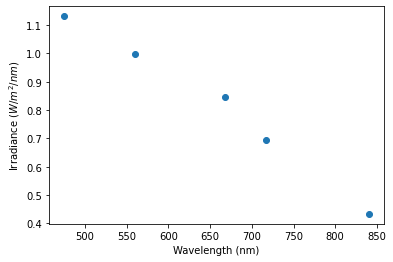

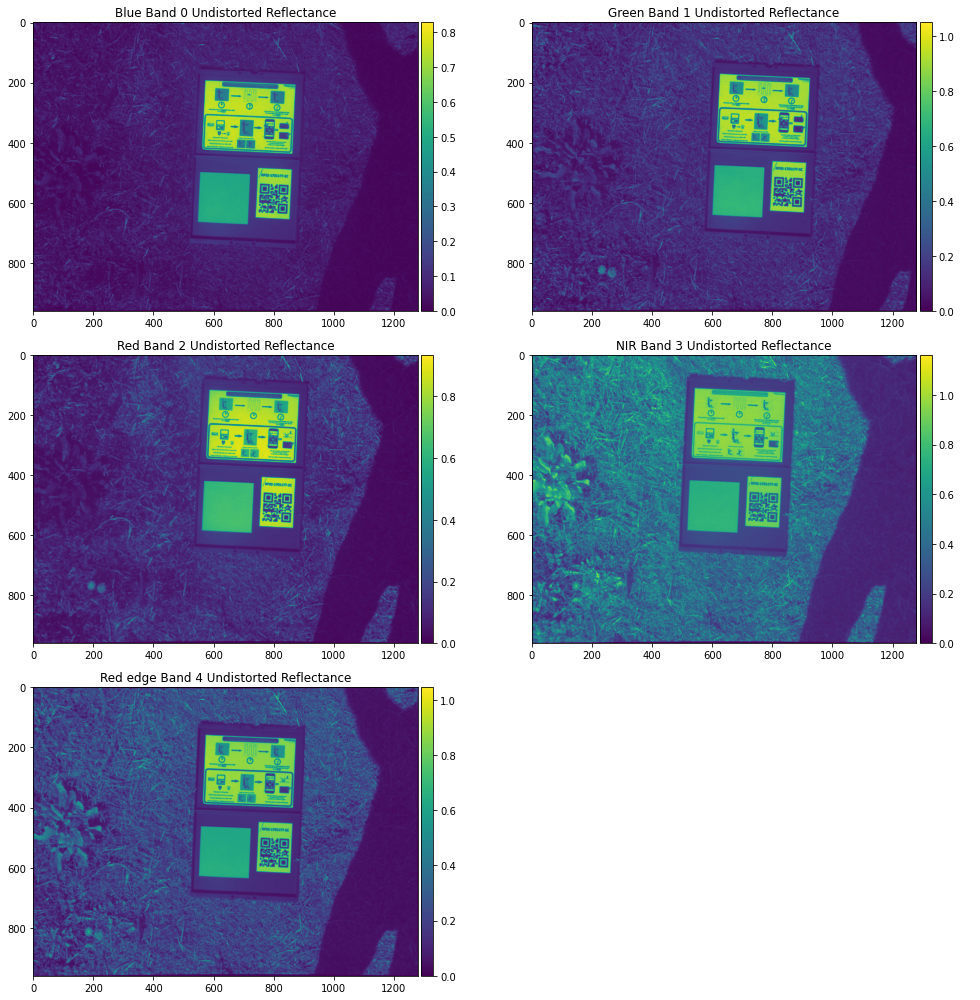

In [4]:
# Since the diffuser reflects more light at shallow angles than at steep angles,
# we compute a correction for this
fresnel_correction = dls.fresnel(sun_sensor_angle)

# Now we can correct the raw DLS readings and compute the irradiance on level ground
dls_irradiances = []
center_wavelengths = []
for img in cap.images:
    dir_dif_ratio = 6.0
    percent_diffuse = 1.0/dir_dif_ratio
    # measured Irradiance / fresnelCorrection
    sensor_irradiance = img.spectral_irradiance / fresnel_correction
    untilted_direct_irr = sensor_irradiance / (percent_diffuse + np.cos(sun_sensor_angle))
    # compute irradiance on the ground using the solar altitude angle
    dls_irr = untilted_direct_irr * (percent_diffuse + np.sin(solar_elevation))
    dls_irradiances.append(dls_irr)
    center_wavelengths.append(img.center_wavelength)

import matplotlib.pyplot as plt
plt.scatter(center_wavelengths,dls_irradiances)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Irradiance ($W/m^2/nm$)')
plt.show();

cap.plot_undistorted_reflectance(dls_irradiances)

## Tying the camera and DLS together via Panels

Finally, if we want to use the panel as the ultimate reference tying the panel and the DLS readings together with a known lambertian reflector, we can calculate a DLS factor which we can then apply to DLS derived irradiances over the whole flight. 

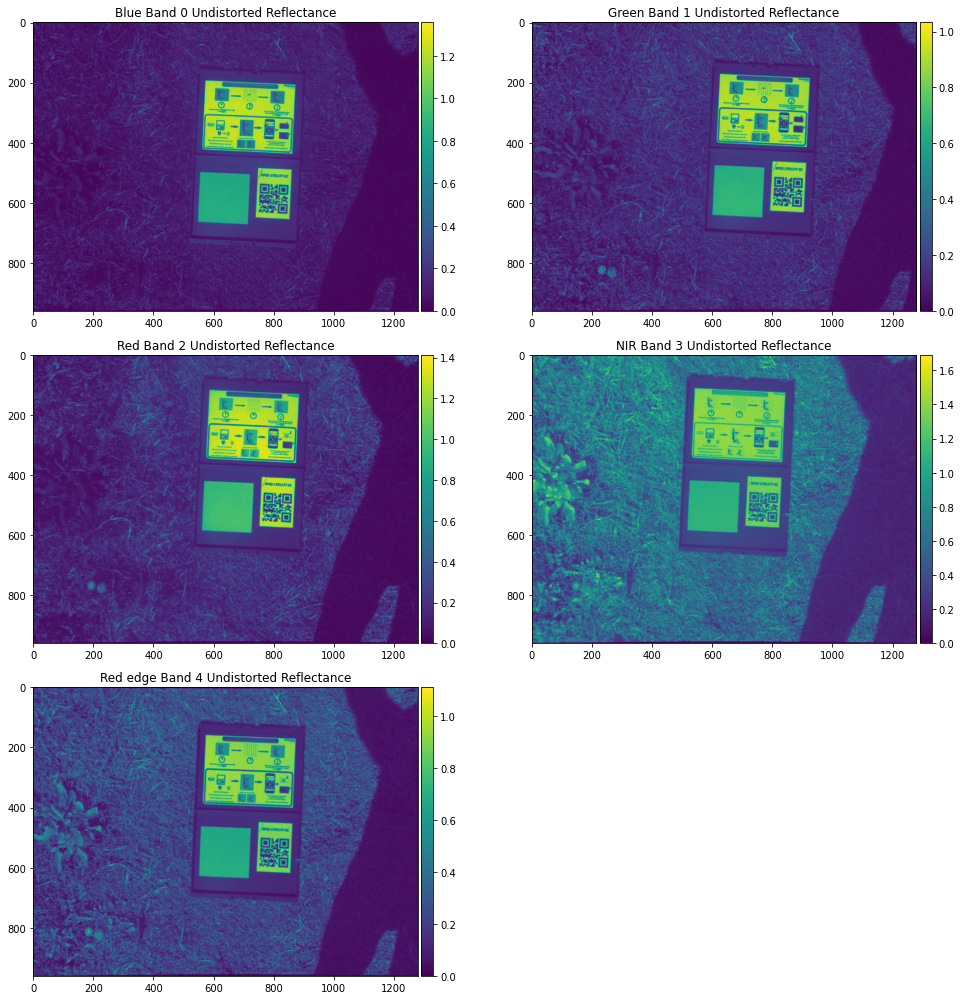

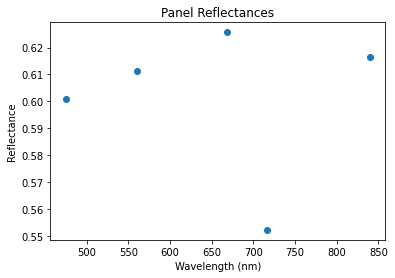

In [5]:
import math

panel_reflectance_by_band = [0.60, 0.61, 0.61, 0.60, 0.55] #RedEdge band_index order

panel_radiances = np.array(cap.panel_radiance())
irr_from_panel = math.pi * panel_radiances / panel_reflectance_by_band
dls_correction = irr_from_panel/dls_irradiances
cap.plot_undistorted_reflectance(dls_irradiances*dls_correction)

plt.scatter(cap.center_wavelengths(), cap.panel_reflectance())
plt.title("Panel Reflectances")
plt.xlabel("Wavelength (nm)")
plt.ylabel("Reflectance")
plt.show()

## --------------------------------------------------------------------------------------------------------------------------------

# ImageSet Extended Examples

A large group of images captured using a RedEdge over a central California orchard are available for [download here](https://s3-us-west-2.amazonaws.com/sample.micasense.com/imageprocessing/RedEdgeImageSet.zip).

With this set extracted to a working folder, this notebook will load all of the images in the set and provide more usage examples of ImageSet data.

## Load a directory of images into an ImageSet

In [6]:
%load_ext autoreload
%autoreload 2

In [8]:
from ipywidgets import FloatProgress, Layout
from IPython.display import display
import micasense.imageset as imageset
import os

## This progress widget is used for display of the long-running process
f = FloatProgress(min=0, max=1, layout=Layout(width='100%'), description="Loading")
display(f)
def update_f(val):
    if (val - f.value) > 0.005 or val == 1: #reduces cpu usage from updating the progressbar by 10x
        f.value=val

images_dir = os.path.expanduser(os.path.join('.','data','DataRedEdge','0008SET'))
%time imgset = imageset.ImageSet.from_directory(images_dir, progress_callback=update_f)

FloatProgress(value=0.0, description='Loading', layout=Layout(width='100%'), max=1.0)

CPU times: user 3.82 s, sys: 81.9 ms, total: 3.91 s
Wall time: 12.6 s


In [9]:
import pandas as pd
data, columns = imgset.as_nested_lists()
print("Columns: {}".format(columns))
df = pd.DataFrame.from_records(data, index='timestamp', columns=columns)
df.head()

Columns: ['timestamp', 'latitude', 'longitude', 'altitude', 'capture_id', 'dls-yaw', 'dls-pitch', 'dls-roll', 'irr-475', 'irr-560', 'irr-668', 'irr-840', 'irr-717']


,latitude,longitude,altitude,capture_id,dls-yaw,dls-pitch,dls-roll,irr-475,irr-560,irr-668,irr-840,irr-717
timestamp,,,,,,,,,,,,
2020-11-06 17:02:33.113537+00:00,4.943889,-74.018579,2577.672,7OCjvHhHBQwh1Am3VAVZ,0.347892,0.149263,0.058778,0.075370,0.078545,0.073228,0.026843,0.046909
2020-11-06 17:02:39.112901+00:00,4.943886,-74.018588,2581.046,1RrKNLH2XnHEV663uC3d,0.349740,0.135361,0.067759,0.069633,0.072768,0.067332,0.024462,0.043231
2020-11-06 17:03:00.110705+00:00,4.943885,-74.018578,2583.118,wLT4ZvSNJ5ldywdSgfZ6,0.341296,0.143024,0.059607,0.073488,0.078301,0.078643,0.025474,0.046020
2020-11-06 17:03:46.105997+00:00,4.943878,-74.018573,2590.016,8OoxKsBRLFrVeRdF2fQh,0.344009,0.136130,0.065837,0.058247,0.064962,0.054275,0.021987,0.037010
2020-11-06 17:04:18.102782+00:00,4.943881,-74.018582,2586.268,B2SwDb71sWVC7Qrehyed,0.361630,0.160954,0.085733,0.070984,0.073821,0.063025,0.024335,0.043254


In [12]:
import math
import numpy as np
from mapboxgl.viz import *
from mapboxgl.utils import df_to_geojson, create_radius_stops, scale_between
from mapboxgl.utils import create_color_stops

#Insert your mapbox token here
token = 'pk.eyJ1IjoibWljYXNlbnNlIiwiYSI6ImNqYWx5dWNteTJ3cWYzMnBicmZid3g2YzcifQ.Zrq9t7GYocBtBzYyT3P4sw'
color_stops = create_color_stops(np.linspace(-math.pi,math.pi,num=8),colors='YlOrRd')
data = df_to_geojson(df,columns[3:],lat='latitude',lon='longitude')
viz = CircleViz(data, access_token=token, color_property='dls-yaw',
                color_stops=color_stops,
                center=[df['longitude'].median(),df['latitude'].median()], 
                zoom=17, height='600px',
                style='mapbox://styles/mapbox/satellite-streets-v9')
viz.show()

## Plotting capture metadata

/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2num function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  base = dates.epoch2num(dt.asi8 / 1.0e9)
/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2num function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  base = dates.epoch2num(dt.asi8 / 1.0e9)
/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2num function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  base = dates.epoch2num(dt.asi8 / 1.0e9)
/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2nu

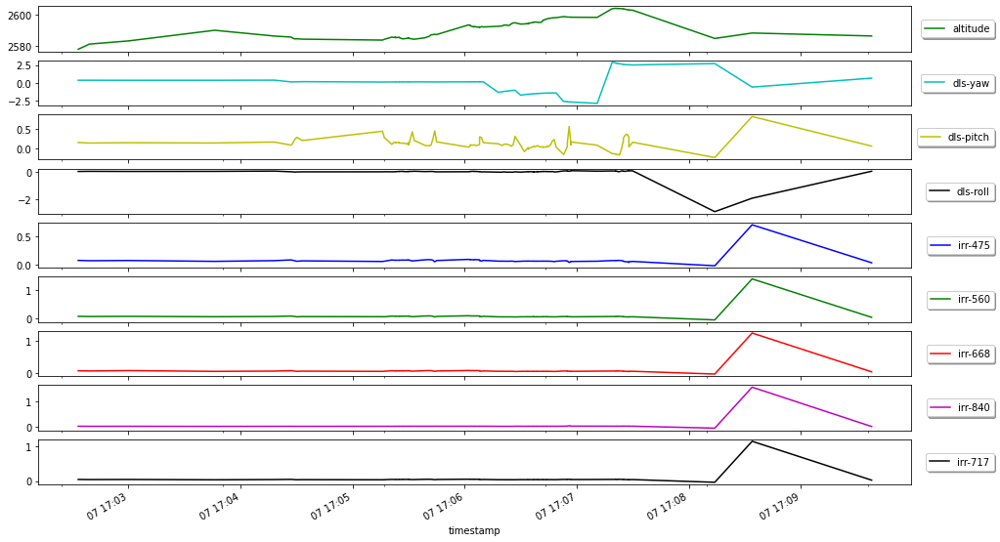

In [13]:
import matplotlib.pyplot as plt
%matplotlib inline
ax=df.plot(y=columns[3:], subplots=True, figsize=(16, 10), style=['g','c','y','k','b','g','r','m','k']);
for a in ax:
    a.legend(loc='right', bbox_to_anchor=(1.1, 0.5), ncol=1, fancybox=True, shadow=True);

## Separating ground and flight images

We can plot a histogram of the image altitudes for all images in the flight and use the basic statistics to guess at an altitude below which the panel images were likely taken. This can give us an altitude threshold we can apply to separate images taken in flight and on the ground.

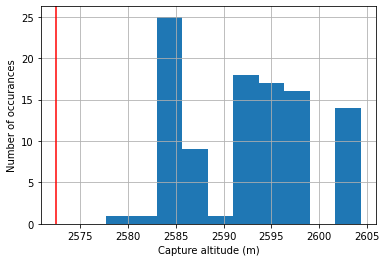

In [14]:
# plot the histogram of the altitude data
df.altitude.hist();
# find the altitude above which the flight images occur
cutoff_altitude = df.altitude.mean()-3.0*df.altitude.std()
plt.axvline(x=cutoff_altitude,c='r');
plt.xlabel('Capture altitude (m)');
plt.ylabel('Number of occurances');

## Automatically extracting radiances of panel images
Using the Panel class, we can automatically find and compute the radiance of panel regions within panel images. Each Capture object exposes a `panel_radiance()` method which can be used on panel images to get a list of the radiance of each band (in the native RedEdge band order).

In [36]:
import numpy as np
flight = df.altitude>cutoff_altitude
ground = ~flight
ground_idx = np.arange(len(ground))[ground]
flight_idx = np.arange(len(ground))[flight]
ground_captures = np.array(imgset.captures)[ground_idx]
flight_captures = np.array(imgset.captures)[flight_idx]

panel_radiances = []
dls_irradiances = []
panel_timestamps = []
for cap in flight_captures:
    if cap.panels_in_all_expected_images():
        panel_timestamps.append(cap.utc_time())
        panel_radiances.append(cap.panel_radiance())
        dls_irradiances.append(cap.dls_irradiance())

dls_irradiances = np.asarray(dls_irradiances)
panel_radiances = np.asarray(panel_radiances)

###
panel_reflectance_by_band = [0.61, 0.60, 0.60, 0.61, 0.55] #RedEdge band_index order
panel_irradiance = flight_captures[0].panel_irradiance(panel_reflectance_by_band)
plt.figure()
plt.scatter(flight_captures[0].center_wavelengths(), panel_irradiance);
plt.xscale('log')
plt.ylabel("Irradiance (w/m^2/nm)");
plt.xlabel("Wavelength (nm)");

ValueError: Input must be >= 2-d.

## Plotting DLS Irradiances
Once we have extracted the panel radiances from the ground images, we can convert them to irradiance as we did in tutorial #1 and plot the irradiances over time and extract radiance to reflectance conversion factors.

/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2num function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  base = dates.epoch2num(dt.asi8 / 1.0e9)
/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2num function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  base = dates.epoch2num(dt.asi8 / 1.0e9)
/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2num function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  base = dates.epoch2num(dt.asi8 / 1.0e9)
/home/regulus/.virtualenv/Science/lib/python3.8/site-packages/pandas/plotting/_matplotlib/converter.py:256: MatplotlibDeprecationWarning: 
The epoch2nu

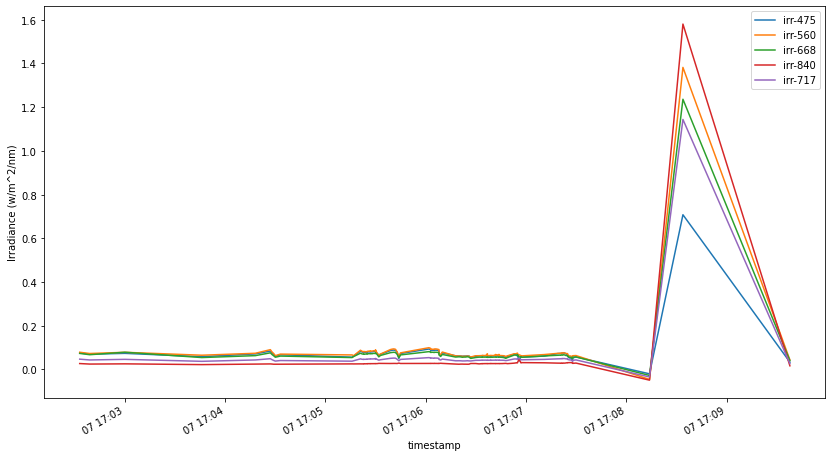

In [15]:
import matplotlib.pyplot as plt
import math

df[df.altitude>cutoff_altitude].plot(y=columns[8:13], figsize=(14,8))
plt.ylabel("Irradiance (w/m^2/nm)");

## --------------------------------------------------------------------------------------------------------------------------------

# Image Alignment

In most use cases, each band of a multispectral capture must be aligned with the other bands in order to create meaningful data.  In this tutorial, we show how to align the band to each other using open source OpenCV utilities.  

Image alignment allows the combination of images into true-color (RGB) and false color (such as CIR) composites, useful for scouting using single images as well as for display and management uses.  In addition to composite images, alignment allows the calculation of pixel-accurate indices such as NDVI or NDRE at the single image level which can be very useful for applications like plant counting and coverage estimations, where mosaicing artifacts may otherwise skew analysis results.  

The image alignment method described below tends to work well on images with abundant image features, or areas of significant contrast.  Cars, buildings, parking lots, and roads tend to provide the best results.  This approach may not work well on images which contain few features or very repetitive features, such as full canopy row crops or fields of repetitive small crops such lettuce or strawberries.  We will disscuss more about the advantages and disadvantages of these methods below.

The functions behind this alignment process can work with most versions of RedEdge and Altum firmware. They will work best with versions above 3.2.0 which include the "RigRelatives" tags. These tags provide a starting point for the image transformation and can help to ensure convergence of the algorithm.

## Opening Images

As we have done in previous examples, we use the micasense.capture class to open, radiometrically correct, and visualize the 5 bands of a RedEdge capture.

First, we'll load the `autoreload` extension.  This lets us change underlying code (such as library functions) without having to reload the entire workbook and kernel. This is useful in this workbook because the cell that runs the alignment can take a long time to run, so with `autoreload` extension we can update the code after the alignment step for analysis and visualization without needing to re-compute the alignments each time.

In [16]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


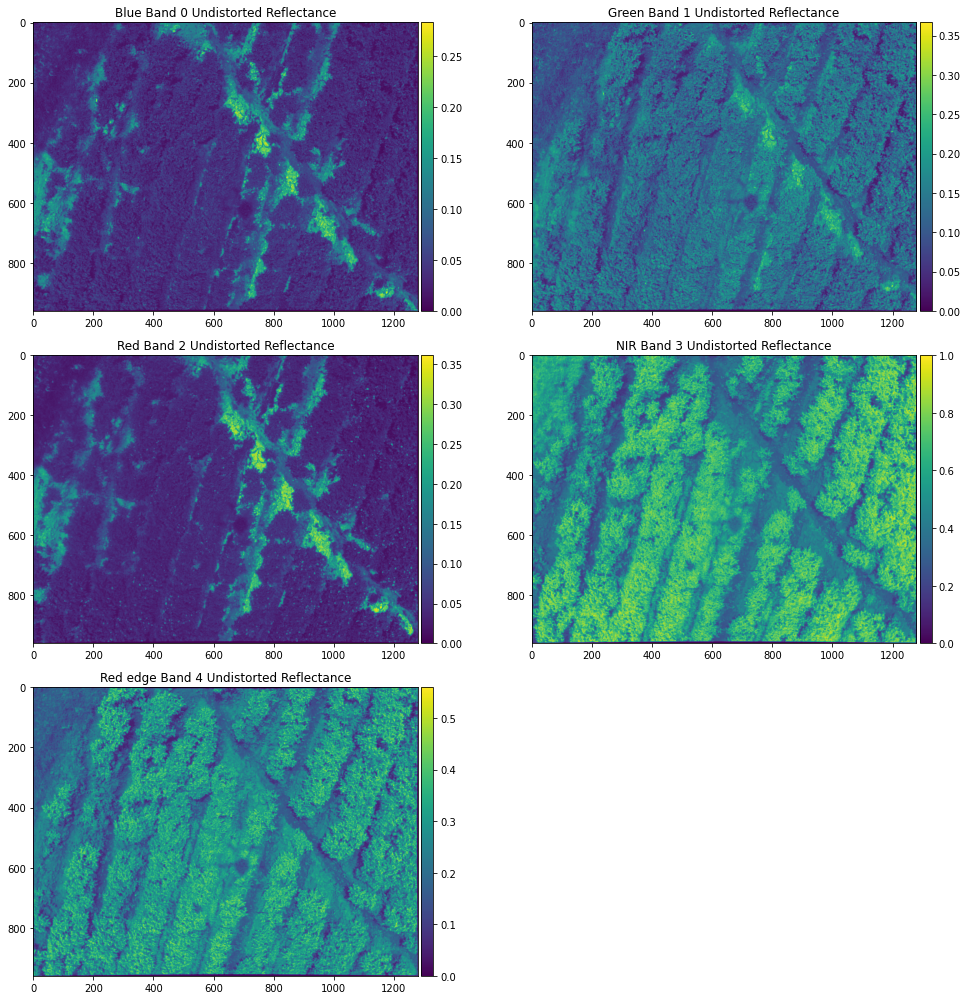

In [27]:
import os, glob
import micasense.capture as capture
%matplotlib inline

panelNames = None

# # This is an older RedEdge image without RigRelatives
# imagePath = os.path.join(os.path.abspath('.'),'data','0000SET','000')
# imageNames = glob.glob(os.path.join(imagePath,'IMG_0001_*.tif'))
# panelNames = glob.glob(os.path.join(imagePath,'IMG_0000_*.tif'))

# # Image from the example RedEdge imageSet (see the ImageSet notebook) without RigRelatives.
imagePath = os.path.expanduser(os.path.join('.','data','DataRedEdge','0008SET'))
imageNames = glob.glob(os.path.join(imagePath,'000','IMG_0010_*.tif'))

imagePath2 = os.path.expanduser(os.path.join('.','data','DataRedEdge','0001SET'))
panelNames = glob.glob(os.path.join(imagePath2,'000','IMG_0001_*.tif'))

# This is an altum image with RigRelatives and a thermal band
#imagePath = os.path.join('.','data','ALTUM1SET','000')
#imageNames = glob.glob(os.path.join(imagePath,'IMG_0245_*.tif'))
#panelNames = glob.glob(os.path.join(imagePath,'IMG_0000_*.tif'))


# Allow this code to align both radiance and reflectance images; bu excluding
# a definition for panelNames above, radiance images will be used
# For panel images, efforts will be made to automatically extract the panel information
# but if the panel/firmware is before Altum 1.3.5, RedEdge 5.1.7 the panel reflectance
# will need to be set in the panel_reflectance_by_band variable.
# Note: radiance images will not be used to properly create NDVI/NDRE images below.
if panelNames is not None:
    panelCap = capture.Capture.from_filelist(panelNames)
else:
    panelCap = None

capture = capture.Capture.from_filelist(imageNames)

if panelCap is not None:
    if panelCap.panel_albedo() is not None:
        panel_reflectance_by_band = panelCap.panel_albedo()
    else:
        panel_reflectance_by_band = [0.60, 0.61, 0.61, 0.60, 0.55] #RedEdge band_index order
    panel_irradiance = panelCap.panel_irradiance(panel_reflectance_by_band)    
    img_type = "reflectance"
    capture.plot_undistorted_reflectance(panel_irradiance)
else:
    if capture.dls_present():
        img_type='reflectance'
        capture.plot_undistorted_reflectance(capture.dls_irradiance())
    else:
        img_type = "radiance"
        capture.plot_undistorted_radiance() 

In [28]:
panel_reflectance_by_band

[0.6, 0.61, 0.61, 0.6, 0.55]

## Unwarp and Align

Alignment is a three step process:

1. Images are unwarped using the built-in lens calibration
1. A transformation is found to align each band to a common band
1. The aligned images are combined and cropped, removing pixels which don't overlap in all bands.

We provide utilities to find the alignement transformations within a single capture.  Our experience shows that once a good alignmnet transformation is found, it tends to be stable over a flight and, in most cases, over many flights.  The transformation may change if the camera undergoes a shock event (such as a hard landing or drop) or if the temperature changes substantially between flights.  In these events a new transformation may need to be found.

Further, since this approach finds a 2-dimensional (affine) transformation between images, it won't work when the parallax between bands results in a 3-dimensional depth field.  This can happen if very close to the target or when targets are visible at significantly different ranges, such as a nearby tree or building against a background much farther way. In these cases it will be necessary to use photogrammetry techniques to find a 3-dimensional mapping between images.

For best alignment results it's good to select a capture which has features which visible in all bands.  Man-made objects such as cars, roads, and buildings tend to work very well, while captures of only repeating crop rows tend to work poorly.  Remember, once a good transformation has been found for flight, it can be generally be applied across all of the images.

It's also good to use an image for alignment which is taken near the same level above ground as the rest of the flights. Above approximately 35m AGL, the alignement will be consistent. However, if images taken closer to the ground are used, such as panel images, the same alignment transformation will not work for the flight data.

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import micasense.imageutils as imageutils
import micasense.plotutils as plotutils

## Alignment settings
match_index = 1 # Index of the band 
max_alignment_iterations = 20
warp_mode = cv2.MOTION_HOMOGRAPHY # MOTION_HOMOGRAPHY or MOTION_AFFINE. For Altum images only use HOMOGRAPHY
pyramid_levels = 0 # for images with RigRelatives, setting this to 0 or 1 may improve alignment

print("Alinging images. Depending on settings this can take from a few seconds to many minutes")
# Can potentially increase max_iterations for better results, but longer runtimes
warp_matrices, alignment_pairs = imageutils.align_capture(capture,
                                                          ref_index = match_index,
                                                          max_iterations = max_alignment_iterations,
                                                          warp_mode = warp_mode,
                                                          pyramid_levels = pyramid_levels)

print("Finished Aligning, warp matrices={}".format(warp_matrices))

Alinging images. Depending on settings this can take from a few seconds to many minutes
Finished aligning band 1
Finished aligning band 3
Finished aligning band 2
Finished aligning band 0
Finished aligning band 4
Finished Aligning, warp matrices=[array([[ 9.9430424e-01, -1.2955323e-04, -1.8122914e-01],
       [-2.6467759e-03,  9.9970186e-01,  1.0090660e+00],
       [-5.2649625e-06,  1.4053854e-06,  1.0000000e+00]], dtype=float32), array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]], dtype=float32), array([[ 1.0014437e+00,  5.5762064e-03, -3.1708782e+00],
       [-4.5940862e-04,  1.0019156e+00,  6.8909478e-01],
       [-4.3500046e-07,  3.2466351e-06,  1.0000000e+00]], dtype=float32), array([[ 1.0030630e+00,  4.1065589e-03, -1.6999054e+00],
       [ 1.2034831e-03,  1.0035945e+00, -6.1383414e-01],
       [ 1.7486419e-06,  2.6873761e-06,  1.0000000e+00]], dtype=float32), array([[ 9.9406594e-01,  1.5569222e-03, -1.6146421e+00],
       [-2.9535675e-03,  9.9665034e-01,  3.1951790e+

## Crop Aligned Images
After finding image alignments we may need to remove pixels around the edges which aren't present in every image in the capture.  To do this we use the affine transforms found above and the image distortions from the image metadata.  OpenCV provides a couple of handy helpers for this task in the  `cv2.undistortPoints()` and `cv2.transform()` methods.  These methods takes a set of pixel coordinates and apply our undistortion matrix and our affine transform, respectively.  So, just as we did when registering the images, we first apply the undistortion process the coordinates of the image borders, then we apply the affine transformation to that result. The resulting pixel coordinates tell us where the image borders end up after this pair of transformations, and we can then crop the resultant image to these coordinates.

In [30]:
cropped_dimensions, edges = imageutils.find_crop_bounds(capture, warp_matrices, warp_mode=warp_mode)
im_aligned = imageutils.aligned_capture(capture, warp_matrices, warp_mode, cropped_dimensions, match_index, img_type=img_type)

## Visualize Aligned Images

Once the transformation has been found, it can be verified by composting the aligned images to check alignment. The image 'stack' containing all bands can also be exported to a multi-band TIFF file for viewing in extrernal software such as QGIS.  Usef ul componsites are a naturally colored RGB as well as color infrared, or CIR. 

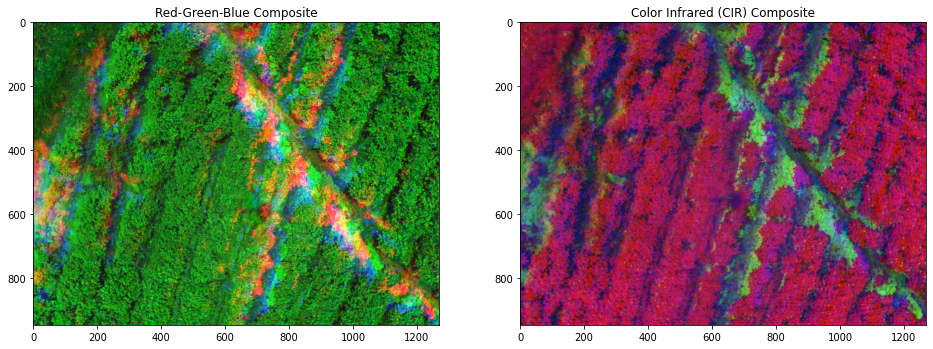

In [31]:
# figsize=(30,23) # use this size for full-image-resolution display
figsize=(16,13)   # use this size for export-sized display

rgb_band_indices = [capture.band_names_lower().index('red'),
                    capture.band_names_lower().index('green'),
                    capture.band_names_lower().index('blue')]
cir_band_indices = [capture.band_names_lower().index('nir'),
                    capture.band_names_lower().index('red'),
                    capture.band_names_lower().index('green')]

# Create a normalized stack for viewing
im_display = np.zeros((im_aligned.shape[0],im_aligned.shape[1],im_aligned.shape[2]), dtype=np.float32 )

im_min = np.percentile(im_aligned[:,:,rgb_band_indices].flatten(), 0.5)  # modify these percentiles to adjust contrast
im_max = np.percentile(im_aligned[:,:,rgb_band_indices].flatten(), 99.5)  # for many images, 0.5 and 99.5 are good values

# for rgb true color, we use the same min and max scaling across the 3 bands to 
# maintain the "white balance" of the calibrated image
for i in rgb_band_indices:
    im_display[:,:,i] =  imageutils.normalize(im_aligned[:,:,i], im_min, im_max)

rgb = im_display[:,:,rgb_band_indices]

# for cir false color imagery, we normalize the NIR,R,G bands within themselves, which provides
# the classical CIR rendering where plants are red and soil takes on a blue tint
for i in cir_band_indices:
    im_display[:,:,i] =  imageutils.normalize(im_aligned[:,:,i])

cir = im_display[:,:,cir_band_indices]
fig, axes = plt.subplots(1, 2, figsize=figsize)
axes[0].set_title("Red-Green-Blue Composite")
axes[0].imshow(rgb)
axes[1].set_title("Color Infrared (CIR) Composite")
axes[1].imshow(cir)
plt.show()

## Image Enhancement

There are many techniques for image enhancement, but one which is commonly used to improve the visual sharpness of imagery is the unsharp mask.  Here we apply an unsharp mask to the RGB image to improve the visualization, and then apply a gamma curve to make the darkest areas brighter.

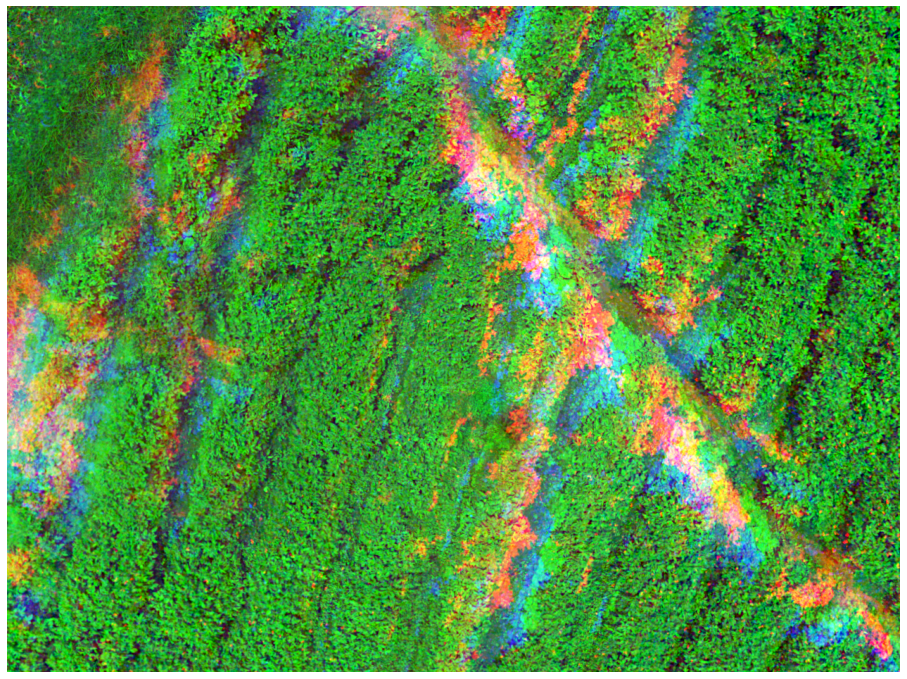

In [32]:
# Create an enhanced version of the RGB render using an unsharp mask
gaussian_rgb = cv2.GaussianBlur(rgb, (9,9), 10.0)
gaussian_rgb[gaussian_rgb<0] = 0
gaussian_rgb[gaussian_rgb>1] = 1
unsharp_rgb = cv2.addWeighted(rgb, 1.5, gaussian_rgb, -0.5, 0)
unsharp_rgb[unsharp_rgb<0] = 0
unsharp_rgb[unsharp_rgb>1] = 1

# Apply a gamma correction to make the render appear closer to what our eyes would see
gamma = 1.4
gamma_corr_rgb = unsharp_rgb**(1.0/gamma)
fig = plt.figure(figsize=figsize)
plt.imshow(gamma_corr_rgb, aspect='equal')
plt.axis('off')
plt.show()

## Image Export

Composite images can be exported to JPEG or PNG format using the `imageio` package.  These images may be useful for visualization or thumbnailing, and creating RGB thumbnails of a set of images can provide a convenient way to browse the imagery in a more visually appealing way that browsing the raw imagery.  

In [33]:
import imageio
imtype = 'png' # or 'jpg'
imageio.imwrite('rgb.'+imtype, (255*gamma_corr_rgb).astype('uint8'))
imageio.imwrite('cir.'+imtype, (255*cir).astype('uint8'))

## Stack Export

We can export the image easily stacks using the `gdal` library (http://www.glal.org). Once exported, these image stacks can be opened in software such as QGIS and raster operations such as NDVI or NDRE computation can be done in that software.  At this time the stacks don't include any geographic information.

In [34]:
from osgeo import gdal, gdal_array
rows, cols, bands = im_display.shape
driver = gdal.GetDriverByName('GTiff')
filename = "bgrne" #blue,green,red,nir,redEdge

if im_aligned.shape[2] == 6:
    filename = filename + "t" #thermal
outRaster = driver.Create(filename+".tiff", cols, rows, im_aligned.shape[2], gdal.GDT_UInt16)

normalize = (img_type == 'radiance') # normalize radiance images to fit with in UInt16

# Output a 'stack' in the same band order as RedEdge/Alutm
# Blue,Green,Red,NIR,RedEdge[,Thermal]
# reflectance stacks are output with 32768=100% reflectance to provide some overhead for specular reflections
# radiance stacks are output with 65535=100% radiance to provide some overhead for specular reflections

# NOTE: NIR and RedEdge are not in wavelength order!

multispec_min = np.min(im_aligned[:,:,1:5])
multispec_max = np.max(im_aligned[:,:,1:5])

In [35]:
for i in range(0,5):
    outband = outRaster.GetRasterBand(i+1)
    if normalize:
        outdata = imageutils.normalize(im_aligned[:,:,i],multispec_min,multispec_max)
    else:
        outdata = im_aligned[:,:,i]
        outdata[outdata<0] = 0
        outdata[outdata>2] = 2
    
    outdata = outdata*32767
    outdata[outdata<0] = 0
    outdata[outdata>65535] = 65535
    outband.WriteArray(outdata)
    outband.FlushCache()

if im_aligned.shape[2] == 6:
    outband = outRaster.GetRasterBand(6)
    outdata = im_aligned[:,:,5] * 100 # scale to centi-C to fit into uint16
    outdata[outdata<0] = 0
    outdata[outdata>65535] = 65535
    outband.WriteArray(outdata)
    outband.FlushCache()
outRaster = None

### Notes on Alignment and Stack Usage

"Stacks" as described above are useful in a number of processing cases.  For example, at the time of this writing, many photogrammetry suites could import and process stack files without significantly impacting the radiometric processing which has already been accomplished.  

Running photogrammetry on stack files instead of raw image files has both advantages and drawbacks. The primary advantage has been found to be an increase in processing speed and a reduction in program memory usage. As the photogrammetric workflow generally operates on luminance images and may not use color information, stacked images may require similar resources and be processed at a similar speed as single-band images.  This is because one band of the stack can be used to generate the matching feature space while the others are ignored for matching purposes. This reduces the feature space 5-fold over matching using all images separately.

One disadvantage is that stacking images outside of the photogrammetric workflow may result in poor image matching.  The RedEdge is known to have stable lens characteristics over the course of normal operation, but variations in temperature or impacts to the camera through handling or rough landings may change the image alignment parameters.  For this reason, we recommend finding a matching transformation for each flight (each take-off and landing).  Alignment transformations from multiple images within a flight can be compared to find the best transformation to apply to the set of the flight.  While not described or supported in this generic implementation, some matching algorithms can use a "seed" value as a starting point to speed up matching.  For most cases, this seed could be the transformation found in a previous flight, or another source of a known good transformation.    

## NDVI Computation

For raw index computation on single images, the numpy package provides a simple way to do math and simple visualizatoin on images.  Below, we compute and visualize an image histogram and then use that to pick a colormap range for visualizing the NDVI of an image. 

### Plant Classification

After computing the NDVI and prior to displaying it, we use a very rudimentary method for focusing on the plants and removing the soil and shadow information from our images and histograms. Below we remove non-plant pixels by setting to zero any pixels in the image where the NIR reflectance is less than 20%.  This helps to ensure that the NDVI and NDRE histograms aren't skewed substantially by soil noise.

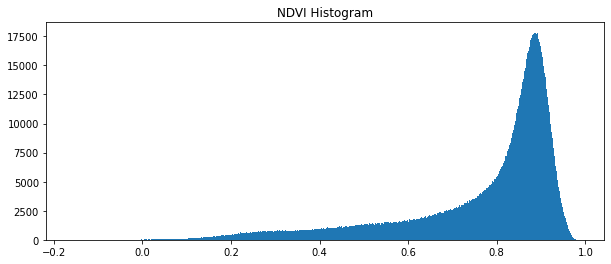

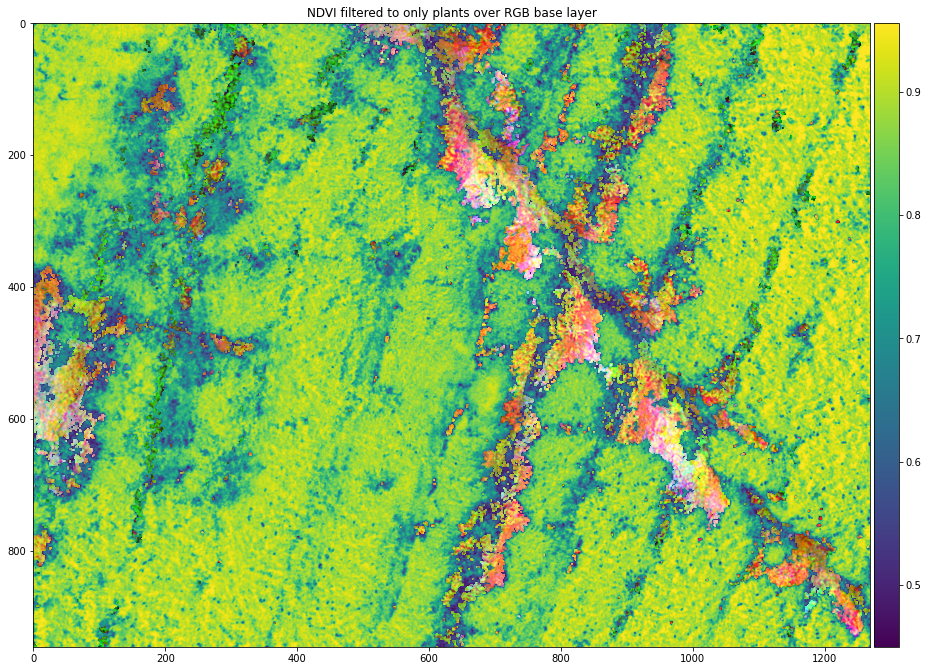

In [36]:
from micasense import plotutils
import matplotlib.pyplot as plt

nir_band = capture.band_names_lower().index('nir')
red_band = capture.band_names_lower().index('red')

np.seterr(divide='ignore', invalid='ignore') # ignore divide by zero errors in the index calculation

# Compute Normalized Difference Vegetation Index (NDVI) from the NIR(3) and RED (2) bands
ndvi = (im_aligned[:,:,nir_band] - im_aligned[:,:,red_band]) / (im_aligned[:,:,nir_band] + im_aligned[:,:,red_band])

# remove shadowed areas (mask pixels with NIR reflectance < 20%))
if img_type == 'reflectance':
    ndvi = np.ma.masked_where(im_aligned[:,:,nir_band] < 0.20, ndvi) 
elif img_type == 'radiance':
    lower_pct_radiance = np.percentile(im_aligned[:,:,3],  10.0)
    ndvi = np.ma.masked_where(im_aligned[:,:,nir_band] < lower_pct_radiance, ndvi) 
    
# Compute and display a histogram
ndvi_hist_min = np.min(ndvi)
ndvi_hist_max = np.max(ndvi)
fig, axis = plt.subplots(1, 1, figsize=(10,4))
axis.hist(ndvi.ravel(), bins=512, range=(ndvi_hist_min, ndvi_hist_max))
plt.title("NDVI Histogram")
plt.show()

min_display_ndvi = 0.45 # further mask soil by removing low-ndvi values
#min_display_ndvi = np.percentile(ndvi.flatten(),  5.0)  # modify with these percentilse to adjust contrast
max_display_ndvi = np.percentile(ndvi.flatten(), 99.5)  # for many images, 0.5 and 99.5 are good values
masked_ndvi = np.ma.masked_where(ndvi < min_display_ndvi, ndvi)

#reduce the figure size to account for colorbar
figsize=np.asarray(figsize) - np.array([3,2])

#plot NDVI over an RGB basemap, with a colorbar showing the NDVI scale
fig, axis = plotutils.plot_overlay_withcolorbar(gamma_corr_rgb, 
                                    masked_ndvi, 
                                    figsize = figsize, 
                                    title = 'NDVI filtered to only plants over RGB base layer',
                                    vmin = min_display_ndvi,
                                    vmax = max_display_ndvi)
fig.savefig('ndvi_over_rgb.png')

## NDRE Computation

In the same manner, we can compute, filter, and display another index useful for the RedEdge camera, the Normalized Difference Red Edge (NDRE) index.  We also filter out shadows and soil to ensure our display focuses only on the plant health.

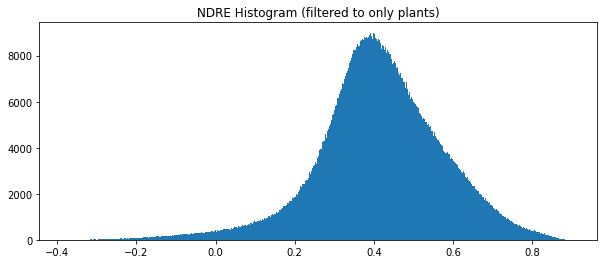

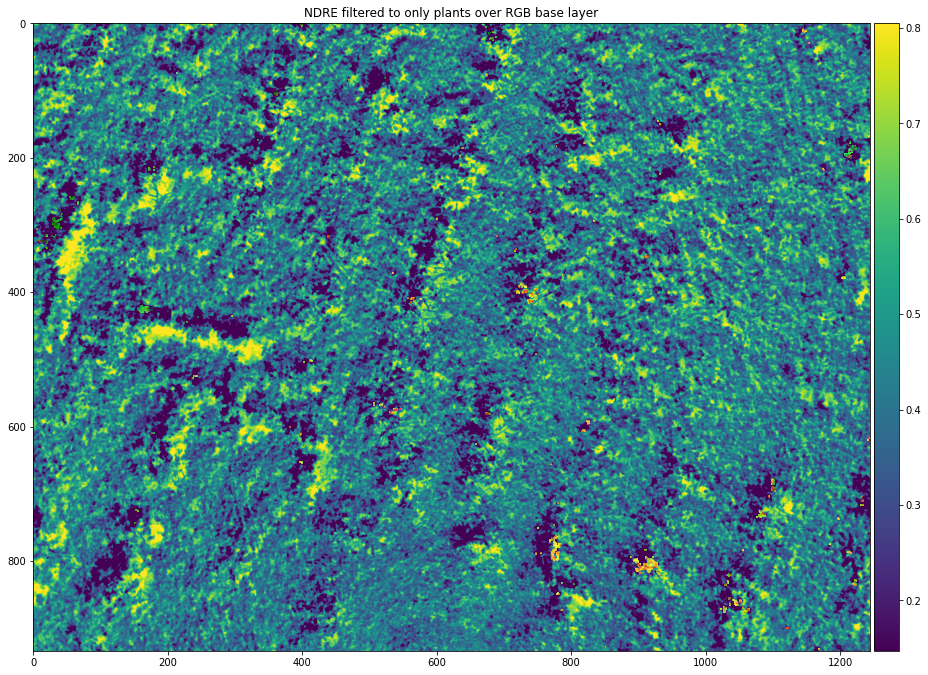

In [26]:
# Compute Normalized Difference Red Edge Index from the NIR(3) and RedEdge(4) bands
rededge_band = capture.band_names_lower().index('red edge')
ndre = (im_aligned[:,:,nir_band] - im_aligned[:,:,rededge_band]) / (im_aligned[:,:,nir_band] + im_aligned[:,:,rededge_band])

# Mask areas with shadows and low NDVI to remove soil
masked_ndre = np.ma.masked_where(ndvi < min_display_ndvi, ndre)

# Compute a histogram
ndre_hist_min = np.min(masked_ndre)
ndre_hist_max = np.max(masked_ndre)
fig, axis = plt.subplots(1, 1, figsize=(10,4))
axis.hist(masked_ndre.ravel(), bins=512, range=(ndre_hist_min, ndre_hist_max))
plt.title("NDRE Histogram (filtered to only plants)")
plt.show()

min_display_ndre = np.percentile(masked_ndre, 5)
max_display_ndre = np.percentile(masked_ndre, 99.5)

fig, axis = plotutils.plot_overlay_withcolorbar(gamma_corr_rgb, 
                                    masked_ndre, 
                                    figsize=figsize, 
                                    title='NDRE filtered to only plants over RGB base layer',
                                    vmin=min_display_ndre,vmax=max_display_ndre)
fig.savefig('ndre_over_rgb.png')

## Thermal Imagery

If our image is from an Altum and includes a thermal band, we can display the re-sampled and aligned thermal data over the RGB data to maintain the context of the thermal information.

In the image below, it's very clear based on the average temperature where the soil is wet and dry, and even in the middle of the road we can find some wetter areas of soil.

In [27]:
if len(capture.lw_indices()) > 0:

    # by default we don't mask the thermal, since it's native resolution is much lower than the MS
    masked_thermal = im_aligned[:,:,5]
    # Alternatively we can mask the thermal only to plants here, which is useful for large contiguous areas
    # masked_thermal = np.ma.masked_where(ndvi < 0.45, im_aligned[:,:,5])


    # Compute a histogram
    fig, axis = plt.subplots(1, 1, figsize=(10,4))
    axis.hist(masked_thermal.ravel(), bins=512, range=(np.min(masked_thermal), np.max(masked_thermal)))
    plt.title("Thermal Histogram")
    plt.show()

    min_display_therm = np.percentile(masked_thermal, 1)
    max_display_therm = np.percentile(masked_thermal, 99)

    fig, axis = plotutils.plot_overlay_withcolorbar(gamma_corr_rgb,
                                        masked_thermal, 
                                        figsize=figsize, 
                                        title='Temperature over True Color',
                                        vmin=min_display_therm,vmax=max_display_therm,
                                        overlay_alpha=0.25,
                                        overlay_colormap='jet',
                                        overlay_steps=16,
                                        display_contours=True,
                                        contour_steps=16,
                                        contour_alpha=.4,
                                        contour_fmt="%.0fC")
    fig.savefig('thermal_over_rgb.png')

## Red vs NIR Reflectance

Finally, we show a classic agricultural remote sensing output in the tassled cap plot.  This plot can be useful for visualizing row crops and plots the Red Reflectance channel on the X-axis against the NIR reflectance channel on the Y-axis. This plot also clearly shows the line of the soil in that space.  The tassled cap view isn't very useful for this arid data set; however, we can see the "badge of trees" of high NIR reflectance and relatively low red reflectance. This provides an example of one of the uses of aligned images for single capture analysis.

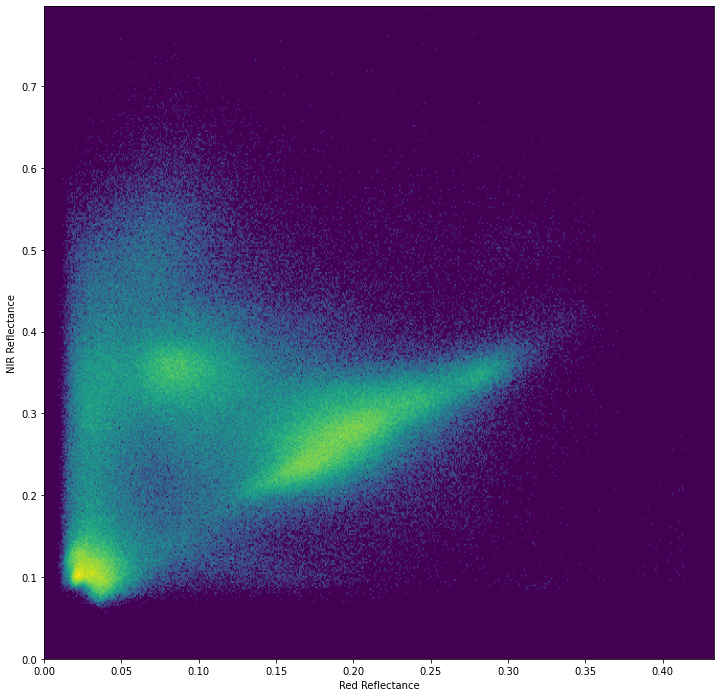

In [28]:
x_band = red_band
y_band = nir_band
x_max = np.max(im_aligned[:,:,x_band])
y_max = np.max(im_aligned[:,:,y_band])

fig = plt.figure(figsize=(12,12))
plt.hexbin(im_aligned[:,:,x_band],im_aligned[:,:,y_band],gridsize=640,bins='log',extent=(0,x_max,0,y_max))
ax = fig.gca()
ax.set_xlim([0,x_max])
ax.set_ylim([0,y_max])
plt.xlabel("{} Reflectance".format(capture.band_names()[x_band]))
plt.ylabel("{} Reflectance".format(capture.band_names()[y_band]))
plt.show()

## --------------------------------------------------------------------------------------------------------------------------------

# Batch Processing Example

In this example, we use the `micasense.imageset` class to load a set of directories of images into a list of `micasense.capture` objects, and we iterate over that list saving out each image as an aligned stack of images as separate bands in a single tiff file each. Next, we use the metadata from the original captures to write out a log file of the captures and their locations.  Finally, we use `exiftool` from the command line to inject that metadata into the processed images, allowing us to stitch those images using commercial software such as Pix4D or Agisoft.

Note: for this example to work, the images must have a valid RigRelatives tag. This requires RedEdge version of at least 3.4.0 or any version of Altum.  If your images don't meet that spec, you can also follow this support ticket to add the RigRelatives tag to them: https://support.micasense.com/hc/en-us/articles/360006368574-Modifying-older-collections-for-Pix4Dfields-support

In [69]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load Images into ImageSet

In [ ]:
from ipywidgets import FloatProgress, Layout
from IPython.display import display
import micasense.imageset as imageset
import micasense.capture as capture
import os, glob
import multiprocessing

panelNames = None
useDLS = True

imagePath = os.path.expanduser(os.path.join('data','RedEdgeImageSet','0000SET'))
panelNames = glob.glob(os.path.join(imagePath,'000','IMG_0000_*.tif'))
panelCap = capture.Capture.from_filelist(panelNames)

outputPath = os.path.join(imagePath,'..','stacks')
thumbnailPath = os.path.join(outputPath, '..', 'thumbnails')

overwrite = False # can be set to set to False to continue interrupted processing
generateThumbnails = True

# Allow this code to align both radiance and reflectance images; bu excluding
# a definition for panelNames above, radiance images will be used
# For panel images, efforts will be made to automatically extract the panel information
# but if the panel/firmware is before Altum 1.3.5, RedEdge 5.1.7 the panel reflectance
# will need to be set in the panel_reflectance_by_band variable.
# Note: radiance images will not be used to properly create NDVI/NDRE images below.
if panelNames is not None:
    panelCap = capture.Capture.from_filelist(panelNames)
else:
    panelCap = None

if panelCap is not None:
    if panelCap.panel_albedo() is not None and not any(v is None for v in panelCap.panel_albedo()):
        panel_reflectance_by_band = panelCap.panel_albedo()
    else:
        panel_reflectance_by_band = [0.67, 0.69, 0.68, 0.61, 0.67] #RedEdge band_index order
    
    panel_irradiance = panelCap.panel_irradiance(panel_reflectance_by_band)    
    img_type = "reflectance"
else:
    if useDLS:
        img_type='reflectance'
    else:
        img_type = "radiance"